### https://www.kaggle.com/code/shubhijoshi/similar-image-finder-using-k-means

# 1. Download data & unzip

In [8]:
# ! pip install kaggle --upgrade
# ! cd notebooks/xai-survey && ls && kaggle datasets download -d paramaggarwal/fashion-product-images-small

Defaulting to user installation because normal site-packages is not writeable
You should consider upgrading via the '/usr/bin/python3 -m pip install --upgrade pip' command.
 All_ref_500.csv   clusters-embeddings	 intents_500.xlsx
 archive.zip	   Data.xlsx		'RC6 nodes info(Abstract).xlsx'
 art_dataset	   HMRServer.jar	'RC6 nodes info.xlsx'
100%|███████████████████████████████████████▉| 565M/565M [00:51<00:00, 11.7MB/s]
100%|████████████████████████████████████████| 565M/565M [00:51<00:00, 11.5MB/s]


In [1]:
# ! apt-get install unzip
# ! cd notebooks/xai-survey && unzip fashion-product-images-small.zip

Archive:  fashion-product-images-small.zip
  inflating: images/10000.jpg        
  inflating: images/10001.jpg        
  inflating: images/10002.jpg        
  inflating: images/10003.jpg        
  inflating: images/10004.jpg        
  inflating: images/10005.jpg        
  inflating: images/10006.jpg        
  inflating: images/10007.jpg        
  inflating: images/10008.jpg        
  inflating: images/10009.jpg        
  inflating: images/10010.jpg        
  inflating: images/10011.jpg        
  inflating: images/10012.jpg        
  inflating: images/10013.jpg        
  inflating: images/10014.jpg        
  inflating: images/10015.jpg        
  inflating: images/10016.jpg        
  inflating: images/10017.jpg        
  inflating: images/10018.jpg        
  inflating: images/10019.jpg        
  inflating: images/10020.jpg        
  inflating: images/10021.jpg        
  inflating: images/10022.jpg        
  inflating: images/10023.jpg        
  inflating: images/10024.jpg        
  infla

In [5]:
! cd notebooks/xai-survey && ls

 All_ref_500.csv		    images
 art_dataset			    intents_500.xlsx
 clusters-embeddings		    myntradataset
 Data.xlsx			   'RC6 nodes info(Abstract).xlsx'
 fashion-product-images-small.zip  'RC6 nodes info.xlsx'
 HMRServer.jar			    styles.csv


# 2. Importing Libraries & define function

In [4]:
# ! pip install opencv-python

Defaulting to user installation because normal site-packages is not writeable
You should consider upgrading via the '/usr/bin/python3 -m pip install --upgrade pip' command.


In [2]:
import datetime
import sys

print(f"UTC now= '{datetime.datetime.utcnow().isoformat().split('.')[0]}'")
print(f'Virtualenv used: {sys.executable}')

import importlib


import numpy as np
import pandas as pd
import ast
import pickle
import math

from pathlib import Path

from sklearn.cluster import KMeans

#for text pre-processing
import re, string

from sklearn.decomposition import TruncatedSVD
# bag of words
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer, HashingVectorizer
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import Normalizer
from sklearn.tree import DecisionTreeClassifier
#for model-building
from sklearn.metrics import classification_report, f1_score, accuracy_score, confusion_matrix,roc_curve,auc
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier

from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

import seaborn as sns
import matplotlib.pyplot as plt

from sklearn import tree

from sentence_transformers import SentenceTransformer
sentence_bert_model = SentenceTransformer('distiluse-base-multilingual-cased-v1')

import spacy
importlib.reload(spacy)
spacy_nlp_model = spacy.load('en_core_web_lg')

from scipy.optimize import minimize_scalar

import nltk
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('averaged_perceptron_tagger')
nltk.download('wordnet')
nltk.download('omw-1.4')
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

# Initialize the lemmatizer
wl = WordNetLemmatizer()

from nltk.corpus import wordnet, stopwords

from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

# for LIME import necessary packages
from lime.lime_text import LimeTextExplainer
from sklearn.pipeline import make_pipeline
from random import randint

from typing import List, Optional, Union, Tuple

UTC now= '2022-05-15T19:22:28'
Virtualenv used: /usr/bin/python3


[nltk_data] Downloading package punkt to
[nltk_data]     /home/mmozolewski/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /home/mmozolewski/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /home/mmozolewski/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /home/mmozolewski/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     /home/mmozolewski/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


In [6]:
import numpy as np 
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import cv2
import os, glob, shutil


In [103]:
def _save_pickle(df, outfile, results_folder):
  if results_folder:
    results_folder_local = f"{str(Path('~').expanduser().resolve())}/{results_folder}"
    # results_folder_local = results_folder
  else:
    results_folder_local = f"{str(Path('~').expanduser().resolve())}/data"
  Path(results_folder_local).mkdir(parents=True, exist_ok=True)
  fname = f"{results_folder_local}/{outfile}.pickle"
  print(fname)
  with open(fname, 'wb') as f:
    pickle.dump(df, f)


def _read_pandas_pickle(infile, data_folder):
  fname = f'{data_folder}/{infile}.pickle'
  return pd.read_pickle(fname)


def get_LSA(df:pd.DataFrame, column_to_omit:str, how_many_dimension:int, random_subsample:Optional[float]) -> Optional[pd.DataFrame]:
    svd = TruncatedSVD(how_many_dimension)
    normalizer = Normalizer(copy=False)
    lsa = make_pipeline(svd, normalizer)
    if random_subsample:
      _df = df.sample(frac=random_subsample)
      print(f"using {len(_df.index)} observations")
      lsa.fit(_df.loc[:, df.columns != column_to_omit])
    else:
      lsa.fit(df.loc[:, df.columns != column_to_omit])
    print(f"explained variance perc = {svd.explained_variance_ratio_.sum()*100}%")

    chunk_size = 1_000
    rows_count = len(df.index)
    chunks = list()
    num_chunks = rows_count // chunk_size + 1
    for i in range(num_chunks):
      print(f"processing chunk {str(i)} of {str(num_chunks)}")
      chunks.append(pd.DataFrame(lsa.transform(df.loc[i*chunk_size : min(rows_count-1, (i+1)*chunk_size-1), df.columns != column_to_omit])))
    _df_lsa = pd.concat(chunks, axis=0)

    _df_lsa = _df_lsa.reset_index()
    del _df_lsa['index']

    _df_lsa[column_to_omit] = df[column_to_omit]
    return _df_lsa


def get_TSNE_and_PCA_embeddings(df:pd.DataFrame, key:str, random_subsample:Optional[float], incl_pca:bool = True):
  if random_subsample:
    _df = df.sample(frac=random_subsample)
    _df.reset_index(inplace=True)
    del _df['index']
    print(f"using {len(_df.index)} observations")
    df_independent_vars = _df.loc[:, (df.columns != key) & (df.columns != 'cluster_kmeans')]
  else:
    _df = df
    df_independent_vars = df.loc[:, (df.columns != key) & (df.columns != 'cluster_kmeans')]

  df_tsne = pd.DataFrame(TSNE(n_components=2).fit_transform(df_independent_vars))
  df_tsne['cluster'] = _df['cluster_kmeans']
  df_tsne.columns = ['x1', 'x2', 'cluster']
  df_tsne[key] = _df[key]

  df_tsne[['x1', 'x2']] = MinMaxScaler().fit_transform(df_tsne[['x1', 'x2']])

  if incl_pca:
    df_pca = pd.DataFrame(PCA(n_components=2).fit_transform(df_independent_vars))
    df_pca['cluster'] = _df['cluster_kmeans']
    df_pca.columns = ['x1', 'x2', 'cluster']
    df_pca[key] = _df[key]

    df_pca[['x1', 'x2']] = MinMaxScaler().fit_transform(df_pca[['x1', 'x2']])
  else:
    df_pca = None

  return df_tsne, df_pca


def k_means(df, column_to_omit, how_many_clusters):
  kmeans = KMeans(n_clusters=how_many_clusters, random_state=2022).fit(df.loc[:, (df.columns != column_to_omit) & (df.columns != 'cluster_kmeans')])
  df['cluster_kmeans'] = kmeans.labels_
  df['cluster_kmeans'] = df['cluster_kmeans'].astype(int)
  return df


def get_image_path(id:Union[int, str]):
  return 'notebooks/xai-survey/images/' + str(id) + '.jpg'

#### Plotting image from each cluster
def plot_example(df_with_cluster_kmeans_column:pd.DataFrame, cluster:Union[int, str], examples_count:int, axs):
  xyz = df_with_cluster_kmeans_column.loc[
    df_with_cluster_kmeans_column['cluster_kmeans'].apply(lambda x: str(x) == str(cluster)), 'id'].sample(n=examples_count).apply(lambda x: get_image_path(x)).tolist()
  img = [cv2.imread(abc,0) for abc in xyz]
  #print("Cluster No "+str(i))
  for j in range(min(examples_count, len(img))):
    try:
      axs[cluster][j].imshow(img[j], cmap = 'gray', interpolation = 'bicubic')
      axs[cluster][j].set_xticks([])
      axs[cluster][j].set_yticks([])
    except:
      axs[j].imshow(img[j], cmap = 'gray', interpolation = 'bicubic')
      axs[j].set_xticks([])
      axs[j].set_yticks([])


def plot_examples(df_with_cluster_kmeans_column:pd.DataFrame, examples_count:int):
  n_clusters = len(df_with_cluster_kmeans_column['cluster_kmeans'].unique())
  fig, axs = plt.subplots(n_clusters, examples_count, figsize=(50, 50)) ### making subplot
  for cluster in range(n_clusters):
    plot_example(df_with_cluster_kmeans_column, cluster, examples_count, axs)

In [4]:
#convert to lowercase, strip and remove punctuations
def preprocess(text, stopwords_list):
  text = text.lower()
  text = text.strip()
  text = re.compile('<.*?>').sub('', text)
  text = re.compile('[%s]' % re.escape(string.punctuation)).sub(' ', text)
  text = re.sub('\s+', ' ', text)
  text = re.sub(r'\[[0-9]*\]', ' ', text)
  text = re.sub(r'[^\w\s]', '', str(text).lower().strip())
  text = re.sub(r'\d', ' ', text)
  text = re.sub(r'\s+', ' ', text)
  text = ' '.join([i for i in text.split() if i not in list(stopwords_list)])
  return text


#LEMMATIZATION
# function to map NTLK position tags
def get_wordnet_pos(tag):
  if tag.startswith('J'):
    return wordnet.ADJ
  elif tag.startswith('V'):
    return wordnet.VERB
  elif tag.startswith('N'):
    return wordnet.NOUN
  elif tag.startswith('R'):
    return wordnet.ADV
  else:
    return wordnet.NOUN


# Tokenize the sentence
def lemmatizer(string):
  word_pos_tags = nltk.pos_tag(word_tokenize(string))  # Get position tags
  a = [wl.lemmatize(tag[0], get_wordnet_pos(tag[1])) for idx, tag in enumerate(word_pos_tags)]  # Map the position tag and lemmatize the word/token
  return " ".join(a)


def finalpreprocess(text, stopwords_list):
  return lemmatizer(preprocess(text, stopwords_list))


def make_include_list(df:pd.DataFrame, columns: List[str]):
  words_to_include =[]
  for column in columns:
    words_to_include += df[column].unique().tolist()
  return list(set(words_to_include))


def get_observation_info(df:pd.DataFrame, key:str, column_year:Optional[Union[str, int]], column_txt:str):
  def wrap_by_word(s, n):
    '''returns a string where \\n is inserted between every n words'''
    if isinstance(s, str):
      a = s.split()
      ret = ''
      for i in range(0, len(a), n):
        ret += ' '.join(a[i:i+n]) + '\n'

      return ret
    return ""

  if column_year:
    return df[key] + " (" + df[column_year].apply(lambda x: str(int(x)) if isinstance(x, int) or isinstance(x, str) else "") + ") " + ": \n" + df[column_txt].apply(lambda x: wrap_by_word(x, 3))
  else:
    return df[key] + ": \n" + df[column_txt].apply(lambda x: wrap_by_word(x, 3))


def label_point(x, y, val, ax, factor):
  a = pd.concat({'x': x, 'y': y, 'val': val}, axis=1)
  for i, point in a.iterrows():
    ax.text(point['x'] + 1*factor, point['y'] - 10*factor, str(point['val']))


def visualise_clusters(df_2d_embedding, key:str, column_year:Optional[Union[str, int]], column_txt:str, random_subsample:Optional[float], factor=1 / 200, base_size=6):
  _fig, _ax = plt.subplots(1, 1, figsize=(base_size*4,base_size*2))
  if random_subsample:
    df_for_plot = df_2d_embedding.sample(frac=random_subsample)
  else:
    df_for_plot = df_2d_embedding
  df_for_plot['cluster'] = df_for_plot['cluster_kmeans'].astype(int)
  sns.scatterplot(data=df_for_plot, x='x1', y='x2', hue='cluster', style='cluster', legend="full", alpha=0.9, s=120, palette="deep", ax=_ax)
  label_point(df_for_plot['x1'], df_for_plot['x2'], get_observation_info(df_for_plot, key, column_year, column_txt), _ax, factor)


# 2b. Class for augmenting clustering

In [149]:
class Pipeline:

  def __init__(self, df: pd.DataFrame, key: str):
    self.df = df
    self.df.reset_index(inplace=True)
    del self.df['index']
    self.key = key
    self.silhouette_scores:Optional[List[Tuple[int, float]]] = None
    self.column_year = None
    self.column_txt = None
    self.clusters_count:Optional[int] = None
    self.df_tsne:Optional[pd.DataFrame] = None
    self.df_pca:Optional[pd.DataFrame] = None
    self.text_column:Optional[str] = None
    self.clf = None
    self.df_metadata: Optional[pd.DataFrame] = None
    self.explainer:  Optional[LimeTextExplainer] = None
    self.c = None
    self.stop_words = None
    self.words_to_include = None
    self.clusters:Optional[List[int]] = None

    self.df['cluster_kmeans'] = np.NaN
    df_tsne, _ = get_TSNE_and_PCA_embeddings(self.df, self.key, .30, False)

    fig, ax = plt.subplots(1, 1, figsize=(12 * 1, 5 * 2))
    ax.set_title('TSNE')
    sns.scatterplot(data=df_tsne, x='x1', y='x2', hue='cluster', style='cluster', legend="full", alpha=0.9, palette="deep", s=100, ax=ax)
    # ax[1].set_title('PCA')
    # sns.scatterplot(data=self.df_pca, x='x1', y='x2', hue='cluster', style='cluster', legend="full", alpha=0.9, palette="deep", s=100, ax=ax[1])

  def plot_silhouette(self, max_clusters_count:int, random_subsample:Optional[float], reset:bool=False):
    if reset or not self.silhouette_scores:
      self.silhouette_scores = []
      # sil = []
      # kl = []
      for k in range(2, max_clusters_count + 1):
        df_subsample = self.df.loc[:, (self.df.columns != self.key) & (self.df.columns != 'cluster_kmeans')]
        if random_subsample:
          df_subsample = df_subsample.sample(frac=random_subsample)
        print(f"processing {k} clusters")
        kmeans2 = KMeans(n_clusters = k).fit(df_subsample)
        labels = kmeans2.labels_
        self.silhouette_scores.append((k, silhouette_score(df_subsample, labels)))
        # sil.append()
        # kl.append(k)

    kl = [x[0] for x in self.silhouette_scores]
    sil = [x[1] for x in self.silhouette_scores]
    plt.figure(figsize=(32, 16))
    plt.plot(kl, sil)
    plt.ylabel('Silhouette Score')
    plt.ylabel('Clusters count')
    # self.silhouette_scores = [x for x in zip(kl, sil)]
    for a, b in self.silhouette_scores:
      plt.text(a, b, f"{int(b*10000)} ({a})")
    plt.show()

  def fit(self, clusters_count: int):
    self.clusters_count = clusters_count
    self.df = k_means(self.df, self.key, clusters_count)
    self.df_tsne, _ = get_TSNE_and_PCA_embeddings(self.df, self.key, None, False)

    fig, ax = plt.subplots(1, 1, figsize=(12 * 1, 5 * 2))
    ax.set_title('TSNE')  # [0]
    sns.scatterplot(data=self.df_tsne, x='x1', y='x2', hue='cluster', style='cluster', legend="full", alpha=0.9, palette="deep", s=100, ax=ax)
    # ax[1].set_title('PCA')
    # sns.scatterplot(data=self.df_pca, x='x1', y='x2', hue='cluster', style='cluster', legend="full", alpha=0.9, palette="deep", s=100, ax=ax[1])

  def init_metadata(self, df_metadata: pd.DataFrame):
    assert self.key in df_metadata.columns
    self.df_metadata = df_metadata.loc[df_metadata[self.key].apply(lambda x: x in self.df[self.key].tolist()), ]
    self.df_metadata.reset_index(inplace=True)
    del self.df_metadata['index']
    if 'cluster_kmeans' in self.df_metadata.columns:
      del self.df_metadata['cluster_kmeans']
    # self.df_metadata.rename(columns={self.key : 'ID'}, inplace=True)
    self.df_metadata = pd.merge(self.df[[self.key, 'cluster_kmeans']], self.df_metadata, on=self.key)
    self.df_metadata = pd.merge(self.df_tsne[[self.key, 'x1', 'x2']], self.df_metadata, on=self.key)

    self.clusters = self.df_metadata['cluster_kmeans'].astype(str).unique().tolist()
    self.clusters.sort()
    print(f"clusters= {self.clusters}")

  def visualise_clustering(self, column_year:Optional[Union[str, int]], column_txt:str, random_subsample:Optional[float], size:int=7):
    self.column_year = column_year
    self.column_txt = column_txt
    if self.clusters_count and self.df_metadata is not None:
      visualise_clusters(self.df_metadata, self.key, self.column_year, self.column_txt, random_subsample, base_size=size*6, factor=1/size * 1/200)

  def explain(self, text_column:str, features_count:int,
      stop_words: Optional[List[str]] = None, words_to_include: Optional[List[str]] = None):
    self.text_column = text_column
    self.stop_words = stop_words
    self.words_to_include = words_to_include

    train, test, train_labels, test_labels = train_test_split(
      self.df_metadata[text_column], self.df_metadata['cluster_kmeans'], test_size=.2, shuffle=True)
    train_labels = np.array(train_labels)
    test_labels = np.array(test_labels)
    vectorizer = TfidfVectorizer(max_features=features_count, stop_words=self.stop_words, min_df=5, max_df=.05, ngram_range=(1, 5))
    vectorizer.fit(train)
    top_features = vectorizer.vocabulary_
    print(f"Explanations will use: {[x for x in top_features.keys()]}")
    for index, feature in enumerate(self.words_to_include):
      top_features[feature] = features_count + index

    self.vectorizer = TfidfVectorizer(vocabulary=top_features)
    self.vectorizer.fit(train)
    self.clf = DecisionTreeClassifier()
    self.clf.fit(self.vectorizer.transform(train), train_labels)
    predict_fn = lambda x: self.clf.predict(self.vectorizer.transform(x))

    preds_train = predict_fn(train)
    preds_test = predict_fn(test)
    print('Train accuracy', accuracy_score(train_labels, preds_train))
    print('Test accuracy', accuracy_score(test_labels, preds_test))

    print(classification_report(test_labels, preds_test))
    print('Confusion Matrix:',)
    print(confusion_matrix(test_labels, preds_test))

    plt.figure(figsize=(3*16, 2*8))
    tree.plot_tree(self.clf, feature_names = self.vectorizer.get_feature_names(), class_names = self.clusters, max_depth=5, fontsize=9, proportion=True, filled=True, rounded=True)

  def lime_example(self, cluster:Optional[Union[int, str]]):
    if not self.explainer:
      self.explainer = LimeTextExplainer(class_names=self.clf.classes_)
      self.c = make_pipeline(self.vectorizer, self.clf)

    if cluster:
      random_row = self.df_metadata.loc[self.df_metadata['cluster_kmeans'].astype(str) == str(cluster), ].sample(n = 1)
    else:
      random_row = self.df_metadata.sample(n = 1)

    _cluster_kmeans = random_row['cluster_kmeans'].tolist()[0]
    _text_to_expl = random_row[self.text_column].tolist()[0]
    print(f"Cluster= {_cluster_kmeans}, text= {_text_to_expl}")
    self.explainer.explain_instance(_text_to_expl, self.c.predict_proba, num_features=5, labels=(_cluster_kmeans,)).show_in_notebook()

  def word_cloud(self, example_presenting_fun:Optional):
    for cluster in self.clusters:
      print (f"cluster= {cluster}")
      if example_presenting_fun:
        examples_count = 7
        fig, axs = plt.subplots(1, examples_count, figsize=(50, 50)) ### making subplot
        example_presenting_fun(self.df_metadata, str(cluster), examples_count, axs)

      # Start with one review:
      # print(self.df_nodes_for_xai.loc[self.df_nodes_for_xai['cluster_kmeans'].astype(str) == cluster, self.text_column].tolist())
      words = word_tokenize(" ".join(self.df_metadata.loc[self.df_metadata['cluster_kmeans'].astype(str) == cluster, self.text_column].tolist()))
      words = [w for w in words if not w.lower() in list(self.stop_words)]

      # Create and generate a word cloud image:
      # text = " ".join(words)

      vectorizer = TfidfVectorizer(max_features=1000, stop_words=self.stop_words, min_df=5, max_df=.20, ngram_range=(1, 5))
      response = vectorizer.fit_transform(words)
      df_tfidf_sklearn = pd.DataFrame(response.toarray(),columns=vectorizer.get_feature_names())
      tf_idf_counter = df_tfidf_sklearn.T.sum(axis=1)

      # print(text)
      wordcloud = WordCloud(background_color='white').generate_from_frequencies(tf_idf_counter)

      # Display the generated image:
      plt.figure(figsize=(15,15))
      plt.imshow(wordcloud, interpolation='bilinear')
      plt.axis("off")
      plt.show()


# 3. Load data & prepare

In [7]:
input_dir = 'notebooks/xai-survey/images'
glob_dir = input_dir + '/*.jpg'
temp  = glob.glob(glob_dir)
print(len(temp))

44441


(44441, 128, 128, 3)


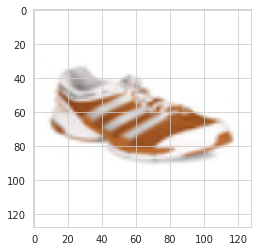

In [8]:
# process all images
selected_images= temp#[0:1000]
paths = [file for file in selected_images]
images = [cv2.resize(cv2.imread(file), (128, 128)) for file in selected_images]
images = np.array(np.float32(images).reshape(len(images),images[0].shape[0],images[0].shape[1],images[0].shape[2])/255)
print(images.shape)
plt.imshow(images[10])

In [8]:
# image size
128 * 128 * 3

49152

# 3b. Calculate images embeddings

In [9]:
# Getting embedded data
## embedding
model = tf.keras.applications.MobileNetV2(include_top = False, weights='imagenet', input_shape=(128, 128, 3))
predictions = model.predict(images.reshape(-1, 128, 128, 3)) ## representation of image to reduce size
pred_images = predictions.reshape(images.shape[0], -1) ## reshape
pred_images.shape

2022-05-14 19:41:05.523865: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-05-14 19:41:05.537132: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcusolver.so.11'; dlerror: libcusolver.so.11: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/mmozolewski/.local/lib/python3.8/site-packages/cv2/../../lib64:/usr/local/cuda-11.0/lib64:
2022-05-14 19:41:05.539741: W tensorflow/core/common_runtime/gpu/gpu_device.cc:1850] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...
2022-05-14 19:41:05.540432: I tensorflow/

(44441, 20480)

In [10]:
pd.DataFrame(pred_images[:10])

,0,1,2,3,4,5,6,7,8,9,...,20470,20471,20472,20473,20474,20475,20476,20477,20478,20479
0,0.000000,0.000000,0.0,0.00000,0.000000,3.490847,1.975876,0.203021,0.0,4.109615,...,0.000000,0.000000,0.000000,0.000000,0.794228,0.0,0.0,0.0,0.000000,0.000000
1,0.000000,0.000000,0.0,0.00000,1.097074,0.000000,0.000000,0.000000,0.0,1.013652,...,0.194866,0.266604,0.155169,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000
2,0.000000,0.000000,0.0,0.00000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,...,0.023009,0.000000,0.000000,0.834312,0.414808,0.0,0.0,0.0,0.000000,0.517837
3,0.000000,0.000000,0.0,0.00000,1.674848,0.000000,0.000000,0.000000,0.0,2.789933,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000
4,0.000000,0.000000,0.0,0.00000,0.000000,0.000000,0.000000,0.000000,0.0,3.851412,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.438278,0.000000
5,0.611750,0.000000,0.0,1.41979,4.280862,0.000000,0.000000,0.000000,0.0,6.000000,...,0.000000,0.000000,0.958634,0.000000,1.276356,0.0,0.0,0.0,0.000000,0.000000
6,0.226754,0.184644,0.0,0.00000,0.000000,0.000000,0.000000,0.000000,0.0,0.807682,...,0.000000,0.000000,0.000000,0.642143,0.000000,0.0,0.0,0.0,0.000000,0.000000
7,0.000000,0.000000,0.0,0.00000,1.509722,0.000000,0.000000,0.000000,0.0,0.050617,...,0.000000,1.896831,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000
8,0.000000,0.000000,0.0,0.00000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,...,0.000000,0.354670,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000
9,0.000000,0.000000,0.0,0.00000,1.239510,0.000000,0.000000,0.000000,0.0,1.782197,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000


In [12]:
df_image_embeddings = pd.DataFrame(pred_images)
df_image_embeddings['id'] = [id.replace('notebooks/xai-survey/images/', '').replace('.jpg', '') for id in selected_images]
# df_image_embeddings.tail()
df_image_embeddings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44441 entries, 0 to 44440
Columns: 20481 entries, 0 to id
dtypes: float32(20480), object(1)
memory usage: 3.4+ GB


In [13]:
# save image embeddings for future reference
_save_pickle(df_image_embeddings, 'df_image_embeddings', 'data')

/home/mmozolewski/data/df_image_embeddings.pickle


# 3c. Read metadata dataset

In [9]:
# CSV is broken, need to read it manually
file1 = open('notebooks/xai-survey/styles.csv', 'r')
_metadata = []
while True:
  # Get next line from file
  line = file1.readline()

  # if line is empty
  # end of file is reached
  if not line:
    break
  _metadata.append(line.strip().split(',', 9))
  # break
file1.close()

df_metadata = pd.DataFrame(_metadata[1:])
df_metadata.columns = _metadata[0]
df_metadata

,id,gender,masterCategory,subCategory,articleType,baseColour,season,year,usage,productDisplayName
0,15970,Men,Apparel,Topwear,Shirts,Navy Blue,Fall,2011,Casual,Turtle Check Men Navy Blue Shirt
1,39386,Men,Apparel,Bottomwear,Jeans,Blue,Summer,2012,Casual,Peter England Men Party Blue Jeans
2,59263,Women,Accessories,Watches,Watches,Silver,Winter,2016,Casual,Titan Women Silver Watch
3,21379,Men,Apparel,Bottomwear,Track Pants,Black,Fall,2011,Casual,Manchester United Men Solid Black Track Pants
4,53759,Men,Apparel,Topwear,Tshirts,Grey,Summer,2012,Casual,Puma Men Grey T-shirt
...,...,...,...,...,...,...,...,...,...,...
44441,17036,Men,Footwear,Shoes,Casual Shoes,White,Summer,2013,Casual,Gas Men Caddy Casual Shoe
44442,6461,Men,Footwear,Flip Flops,Flip Flops,Red,Summer,2011,Casual,Lotto Men's Soccer Track Flip Flop
44443,18842,Men,Apparel,Topwear,Tshirts,Blue,Fall,2011,Casual,Puma Men Graphic Stellar Blue Tshirt
44444,46694,Women,Personal Care,Fragrance,Perfume and Body Mist,Blue,Spring,2017,Casual,Rasasi Women Blue Lady Perfume


In [20]:
# test if we can match emebeddings df and metadata
df_metadata_merge_test = pd.merge(df_metadata, df_image_embeddings[['id', 0, 1]], on="id")
# df_metadata_merge_test.tail()
df_metadata_merge_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 44441 entries, 0 to 44440
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   id                  44441 non-null  object 
 1   gender              44441 non-null  object 
 2   masterCategory      44441 non-null  object 
 3   subCategory         44441 non-null  object 
 4   articleType         44441 non-null  object 
 5   baseColour          44441 non-null  object 
 6   season              44441 non-null  object 
 7   year                44441 non-null  object 
 8   usage               44441 non-null  object 
 9   productDisplayName  44441 non-null  object 
 10  0                   44441 non-null  float32
 11  1                   44441 non-null  float32
dtypes: float32(2), object(10)
memory usage: 4.1+ MB


,id,gender,masterCategory,subCategory,articleType,baseColour,season,year,usage,productDisplayName,0,1
5852,43849,Women,Accessories,Jewellery,Earrings,Green,Summer,2012,Ethnic,Royal Diadem White & Green Earrings,0.0,0.0


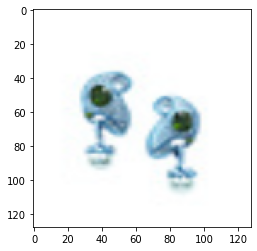

In [21]:
# sanity check - example product
_test_N = 8889
_id = selected_images[_test_N].replace('notebooks/xai-survey/images/', '').replace('.jpg', '')
plt.imshow(images[_test_N])
df_metadata_merge_test.loc[df_metadata_merge_test['id'] == _id, ]


# 3d. Reduction of variables sapce with LSA
- contribution 1: helper function for LSA (memory optimisation by chunking data)

In [188]:
# df_image_embeddings = _read_pandas_pickle('df_image_embeddings', 'data')  # read data back if needed
df_image_embeddings_lsa = get_LSA(df_image_embeddings, 'id', 3000, None)  # contribution 1

explained variance perc = 93.19395422935486%
processing chunk 0 of 45
processing chunk 1 of 45
processing chunk 2 of 45
processing chunk 3 of 45
processing chunk 4 of 45
processing chunk 5 of 45
processing chunk 6 of 45
processing chunk 7 of 45
processing chunk 8 of 45
processing chunk 9 of 45
processing chunk 10 of 45
processing chunk 11 of 45
processing chunk 12 of 45
processing chunk 13 of 45
processing chunk 14 of 45
processing chunk 15 of 45
processing chunk 16 of 45
processing chunk 17 of 45
processing chunk 18 of 45
processing chunk 19 of 45
processing chunk 20 of 45
processing chunk 21 of 45
processing chunk 22 of 45
processing chunk 23 of 45
processing chunk 24 of 45
processing chunk 25 of 45
processing chunk 26 of 45
processing chunk 27 of 45
processing chunk 28 of 45
processing chunk 29 of 45
processing chunk 30 of 45
processing chunk 31 of 45
processing chunk 32 of 45
processing chunk 33 of 45
processing chunk 34 of 45
processing chunk 35 of 45
processing chunk 36 of 45
pro

In [189]:
df_image_embeddings_lsa.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44441 entries, 0 to 44440
Columns: 3001 entries, 0 to id
dtypes: float32(3000), object(1)
memory usage: 508.9+ MB


In [190]:
df_image_embeddings_lsa.tail()

,0,1,2,3,4,5,6,7,8,9,...,2991,2992,2993,2994,2995,2996,2997,2998,2999,id
44436,0.559827,0.364834,-0.179952,-0.091714,0.140205,-0.063002,-0.286837,-0.152043,0.041409,0.145311,...,-0.001364,-0.006181,-0.001071,-0.003781,0.001582,0.003543,-0.010412,-0.004472,0.001637,32518
44437,0.420029,0.027995,0.214225,0.107724,-0.085137,0.196451,0.130375,-0.061441,-0.042040,0.191122,...,0.003482,0.001846,-0.001265,0.001717,0.004097,0.003086,-0.004396,-0.000383,0.003662,51516
44438,0.621270,-0.227673,0.001352,-0.146869,-0.194079,-0.013890,-0.056172,-0.049083,0.045102,0.031358,...,-0.001441,0.002704,0.006536,-0.000997,-0.005124,0.001332,-0.002221,-0.003109,0.003998,57442
44439,0.674413,-0.162095,-0.023080,-0.063712,-0.111598,-0.148997,-0.001704,-0.131711,0.026659,0.023306,...,-0.000907,0.007747,-0.000883,-0.004208,0.004268,0.000681,-0.003245,-0.006353,0.000244,2065
44440,0.534263,0.429810,-0.251824,-0.156936,0.108749,0.147126,-0.059324,0.058150,0.041745,-0.044854,...,0.005234,-0.006177,-0.011308,0.000476,0.005564,-0.006690,0.001247,0.002600,-0.005095,38787


In [191]:
# save LSA for future reference
_save_pickle(df_image_embeddings_lsa.loc[:, df_image_embeddings_lsa.columns != 'cluster_kmeans'], 'df_image_embeddings_lsa', 'data')

/home/mmozolewski/data/df_image_embeddings_lsa.pickle


# 3e. Prepare textual data for explanations
- contribution 2: use numeric variables in textual explanations
- contribution 3: force some terms to be included in explanations

In [206]:
df_metadata.describe()

,id,gender,masterCategory,subCategory,articleType,baseColour,season,year,usage,productDisplayName
count,44446,44446,44446,44446,44446,44446,44446,44446,44446,44446
unique,44446,5,7,45,143,47,5,14,10,31137
top,15970,Men,Apparel,Topwear,Tshirts,Black,Summer,2012,Casual,Lucera Women Silver Earrings
freq,1,22165,21400,15405,7070,9732,21476,16290,34414,82


In [207]:
df_metadata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44446 entries, 0 to 44445
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   id                  44446 non-null  object
 1   gender              44446 non-null  object
 2   masterCategory      44446 non-null  object
 3   subCategory         44446 non-null  object
 4   articleType         44446 non-null  object
 5   baseColour          44446 non-null  object
 6   season              44446 non-null  object
 7   year                44446 non-null  object
 8   usage               44446 non-null  object
 9   productDisplayName  44446 non-null  object
dtypes: object(10)
memory usage: 3.4+ MB


In [13]:
# stopwords for preprocessing
user_defined_stopwords = spacy_nlp_model.Defaults.stop_words
print(len(user_defined_stopwords))
print('approach' in user_defined_stopwords)

user_defined_stopwords.update(stopwords.words('english'))
print(len(user_defined_stopwords))

df_metadata['productDisplayNameCleaned'] = df_metadata['productDisplayName'].apply(lambda x: finalpreprocess(x, user_defined_stopwords) if isinstance(x, str) and x != "" else np.NaN)
df_metadata

326
False
382


,id,gender,masterCategory,subCategory,articleType,baseColour,season,year,usage,productDisplayName,productDisplayNameCleaned
0,15970,Men,Apparel,Topwear,Shirts,Navy Blue,Fall,2011,Casual,Turtle Check Men Navy Blue Shirt,turtle check men navy blue shirt
1,39386,Men,Apparel,Bottomwear,Jeans,Blue,Summer,2012,Casual,Peter England Men Party Blue Jeans,peter england men party blue jean
2,59263,Women,Accessories,Watches,Watches,Silver,Winter,2016,Casual,Titan Women Silver Watch,titan woman silver watch
3,21379,Men,Apparel,Bottomwear,Track Pants,Black,Fall,2011,Casual,Manchester United Men Solid Black Track Pants,manchester united men solid black track pant
4,53759,Men,Apparel,Topwear,Tshirts,Grey,Summer,2012,Casual,Puma Men Grey T-shirt,puma men grey shirt
...,...,...,...,...,...,...,...,...,...,...,...
44441,17036,Men,Footwear,Shoes,Casual Shoes,White,Summer,2013,Casual,Gas Men Caddy Casual Shoe,gas men caddy casual shoe
44442,6461,Men,Footwear,Flip Flops,Flip Flops,Red,Summer,2011,Casual,Lotto Men's Soccer Track Flip Flop,lotto men soccer track flip flop
44443,18842,Men,Apparel,Topwear,Tshirts,Blue,Fall,2011,Casual,Puma Men Graphic Stellar Blue Tshirt,puma men graphic stellar blue tshirt
44444,46694,Women,Personal Care,Fragrance,Perfume and Body Mist,Blue,Spring,2017,Casual,Rasasi Women Blue Lady Perfume,rasasi woman blue lady perfume


In [14]:
# use metadata in textual explanations:
df_metadata['yearLabel'] = 'Year' + df_metadata['year']  # contribution 2

df_metadata['explainColumn'] = df_metadata['gender'] + " " + \
                               df_metadata['masterCategory'] + " " + \
                               df_metadata['subCategory'] + " " + \
                               df_metadata['articleType'] + " " + \
                               df_metadata['baseColour'] + " " + \
                               df_metadata['season'] + " " + \
                               df_metadata['yearLabel'] + " " + \
                               df_metadata['usage'] + " " + \
                               df_metadata['productDisplayNameCleaned']# + " " + \

df_metadata[['explainColumn']]

,explainColumn
0,Men Apparel Topwear Shirts Navy Blue Fall Year...
1,Men Apparel Bottomwear Jeans Blue Summer Year2...
2,Women Accessories Watches Watches Silver Winte...
3,Men Apparel Bottomwear Track Pants Black Fall ...
4,Men Apparel Topwear Tshirts Grey Summer Year20...
...,...
44441,Men Footwear Shoes Casual Shoes White Summer Y...
44442,Men Footwear Flip Flops Flip Flops Red Summer ...
44443,Men Apparel Topwear Tshirts Blue Fall Year2011...
44444,Women Personal Care Fragrance Perfume and Body...


In [15]:
# contribution 3 - force some terms to be included in explanations:
words_to_include_starting_list = make_include_list(df_metadata, ['gender', 'masterCategory', 'subCategory',
                                                                 'articleType', 'baseColour', 'season',
                                                                'yearLabel', 'usage',])
words_to_include_starting_list = [x.title().replace(' ', '') for x in words_to_include_starting_list if x and x != 'NA']
print(words_to_include_starting_list)

['CasualShoes', 'Jewellery', 'AccessoryGiftSet', 'Multi', 'TurquoiseBlue', 'Red', 'Shirts', 'Boxers', 'Cream', 'Patiala', 'Cufflinks', 'Salwar', 'LipPlumper', 'HighlighterAndBlush', 'Trunk', 'LipCare', 'Footballs', 'Fall', 'LipGloss', 'ShoeLaces', 'Makeup', 'Churidar', 'EyeCream', 'Briefs', 'Year2008', 'Robe', 'Hat', 'SportingGoods', 'Innerwear', 'Backpacks', 'Caps', 'BodyWashAndScrub', 'Year2013', 'NavyBlue', 'SportsEquipment', 'Travel', 'RainTrousers', 'Heels', 'Watches', 'Tops', 'KurtaSets', 'LoungeShorts', 'Scarves', 'Year2007', 'GreyMelange', 'Sarees', 'Ethnic', 'TrackPants', 'Gloves', 'Kurtis', 'RainJacket', 'Rompers', 'BathAndBody', 'Camisoles', 'Toner', 'Winter', 'Sports', 'Handbags', 'Bottomwear', 'Peach', 'Perfumes', 'Dress', 'Jeggings', 'SportsAccessories', 'Shorts', 'Sandal', 'Trousers', 'White', 'KajalAndEyeliner', 'Kurtas', 'Casual', 'LehengaCholi', 'LaptopBag', 'Fragrance', 'Year2010', 'Tan', 'BathRobe', 'Silver', 'Black', 'CoffeeBrown', 'Taupe', 'Year2015', 'SportsSanda

# 4 Example on subsample
- contribution 4: help to find correct number of clusters with visual aid

In [12]:
df_image_embeddings_lsa = _read_pandas_pickle('df_image_embeddings_lsa', '/home/mmozolewski/data')  # read data back if needed

In [108]:
# draw subsample
df_image_embeddings_lsa_5k_subsample = df_image_embeddings_lsa.sample(n = 5000).copy()

using 1500 observations
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Columns: 3002 entries, 0 to cluster_kmeans
dtypes: float32(3000), float64(1), object(1)
memory usage: 57.3+ MB


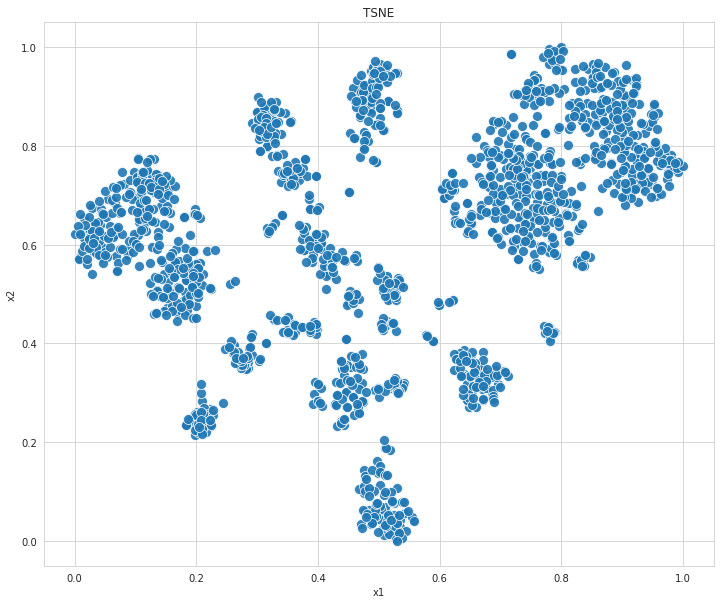

In [145]:
_pipeline = Pipeline(df_image_embeddings_lsa_5k_subsample, key = 'id')  # contribution 4: plots TSNE on 30% of observations as a hint for number of clusters
_pipeline.df.info()

# 4b. Plotting Silhouette
- # contribution 4: find optimal number of clusters in k-means

processing 2 clusters
processing 3 clusters
processing 4 clusters
processing 5 clusters
processing 6 clusters
processing 7 clusters
processing 8 clusters
processing 9 clusters
processing 10 clusters
processing 11 clusters
processing 12 clusters
processing 13 clusters
processing 14 clusters
processing 15 clusters
processing 16 clusters
processing 17 clusters
processing 18 clusters
processing 19 clusters
processing 20 clusters
processing 21 clusters
processing 22 clusters
processing 23 clusters
processing 24 clusters
processing 25 clusters
processing 26 clusters
processing 27 clusters
processing 28 clusters
processing 29 clusters
processing 30 clusters


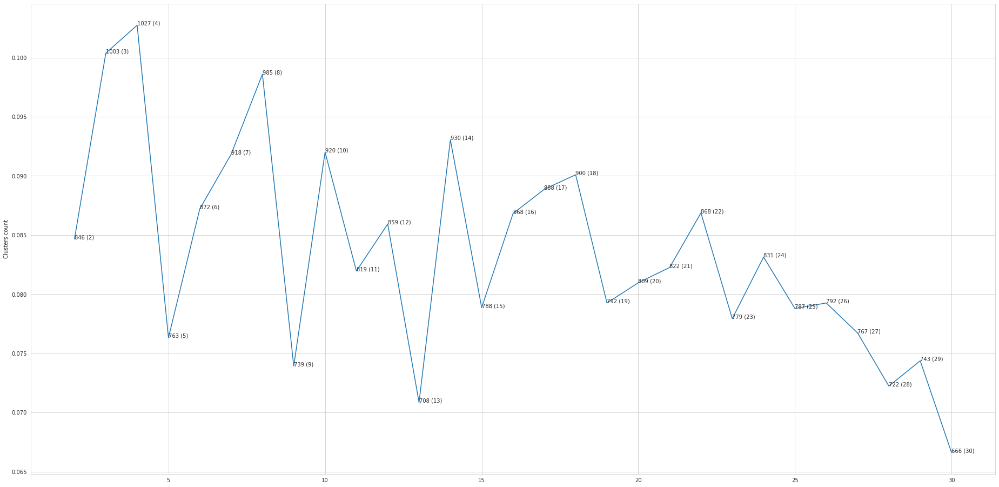

In [150]:
_pipeline.plot_silhouette(30, None, True)

# 4c. Fit and plot

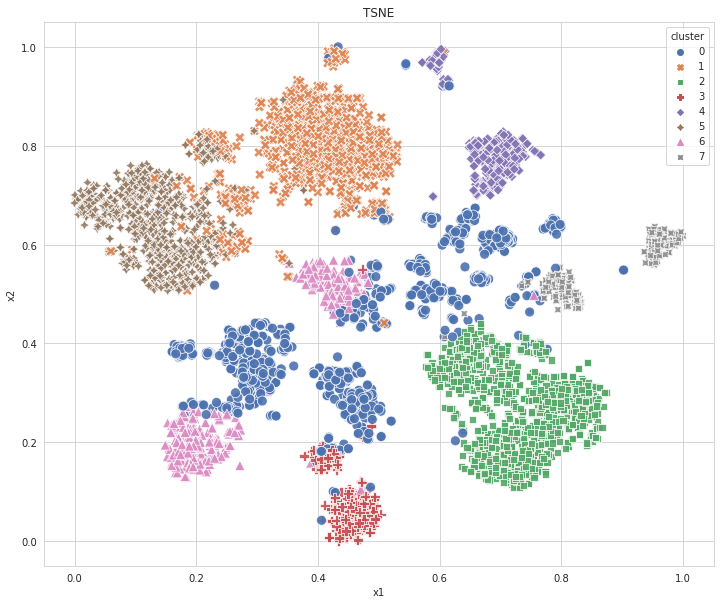

In [151]:
## given silhouette and tsne on this sample:
_pipeline.fit(8)

# 4d. Use Textual data
- contribution 5: visualise clusters with textual labels

In [152]:
_pipeline.init_metadata(df_metadata)
_pipeline.df_metadata

clusters= ['0', '1', '2', '3', '4', '5', '6', '7']


,id,x1,x2,cluster_kmeans,gender,masterCategory,subCategory,articleType,baseColour,season,year,usage,productDisplayName,productDisplayNameCleaned,yearLabel,explainColumn
0,30493,0.429710,0.977552,1,Women,Apparel,Innerwear,Bra,Pink,Summer,2014,Casual,Lovable Women Fiona Rose Pink Bra,lovable woman fiona rise pink bra,Year2014,Women Apparel Innerwear Bra Pink Summer Year20...
1,23279,0.197574,0.155921,6,Men,Accessories,Watches,Watches,Blue,Winter,2016,Casual,Maxima Ssteele Men Blue Watch,maximum ssteele men blue watch,Year2016,Men Accessories Watches Watches Blue Winter Ye...
2,9080,0.670564,0.709275,4,Men,Apparel,Bottomwear,Track Pants,Grey,Fall,2011,Sports,ADIDAS Men Adna Revpt Grey Trackpant,adidas men adna revpt grey trackpant,Year2011,Men Apparel Bottomwear Track Pants Grey Fall Y...
3,19650,0.352656,0.892560,1,Women,Apparel,Topwear,Tops,Purple,Fall,2011,Casual,United Colors of Benetton Women Solid Purple Top,united color benetton woman solid purple,Year2011,Women Apparel Topwear Tops Purple Fall Year201...
4,13640,0.821013,0.321833,2,Women,Footwear,Shoes,Flats,Purple,Winter,2012,Casual,Carlton London Women Purple Flat Shoes,carlton london woman purple flat shoe,Year2012,Women Footwear Shoes Flats Purple Winter Year2...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,3391,0.486293,0.109075,0,Women,Accessories,Bags,Handbags,White,Winter,2015,Casual,Murcia Women White With Stitch Bag,murcia woman white stitch bag,Year2015,Women Accessories Bags Handbags White Winter Y...
4996,48148,0.475537,0.286937,0,Women,Accessories,Wallets,Wallets,Red,Winter,2016,Casual,Fossil Women Red Wallet,fossil woman red wallet,Year2016,Women Accessories Wallets Wallets Red Winter Y...
4997,49640,0.387261,0.869516,1,Women,Apparel,Topwear,Tops,Turquoise Blue,Summer,2012,Casual,Mineral Women Turquoise Blue Top,mineral woman turquoise blue,Year2012,Women Apparel Topwear Tops Turquoise Blue Summ...
4998,19892,0.794497,0.538489,7,Men,Accessories,Belts,Belts,Black,Fall,2011,Casual,Lee Men Canvas Black Belt,lee men canvas black belt,Year2011,Men Accessories Belts Belts Black Fall Year201...


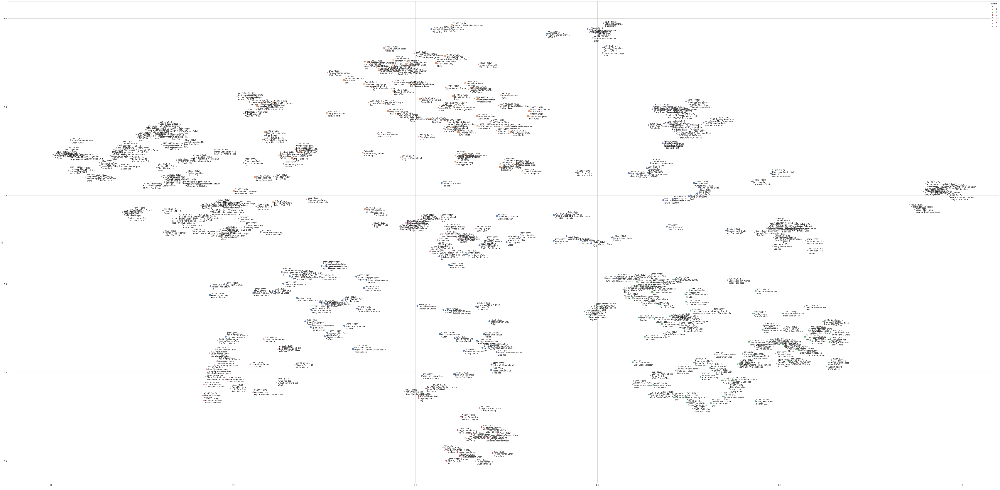

In [153]:
_pipeline.visualise_clustering(column_year = 'year', column_txt = 'productDisplayName', random_subsample=.1, size=4)  # contribution 5: plot on subsample, size factor

# 4e. Explanations based on textual data
- contribution 6:
  - interactively set amount of vocabulary: observe what terms are important (TfidfVectorizer)
  - train DecisionTreeClassifier on using both user defined blacklist (stopwords) and withe list (words to include, like year)
  - check Test accuracy and, weighted avg f1-score and confusion matrix
  - observe how classifier explains discovered categories

Explanations will use: ['heels', 'sandal', 'shoes heels', 'winter year2012', 'woman black', 'footwear shoes heels', 'women footwear shoes heels', 'check', 'tops', 'puma', 'topwear tops', 'casual puma', 'apparel topwear tops', 'women apparel topwear tops', 'black summer year2012 casual', 'silver', 'black fall', 'fall year2012', 'year2012 sports', 'pink', 'fall year2012 casual', 'kurtas', 'kurta', 'topwear kurtas', 'woman print', 'apparel topwear kurtas', 'women apparel topwear kurtas', 'puma men', 'men accessories watches', 'men accessories watches watches', 'purple', 'flip', 'flops', 'flip flops', 'adidas', 'casual adidas', 'adidas men', 'men apparel bottomwear', 'black winter year2016', 'black winter year2016 casual', 'white fall', 'women apparel topwear tshirts', 'handbags', 'bags handbags', 'women accessories bags', 'accessories bags handbags', 'women accessories bags handbags', 'sport', 'shoes sports', 'sports shoes', 'shoes white', 'men white', 'sport shoe', 'footwear shoes sports

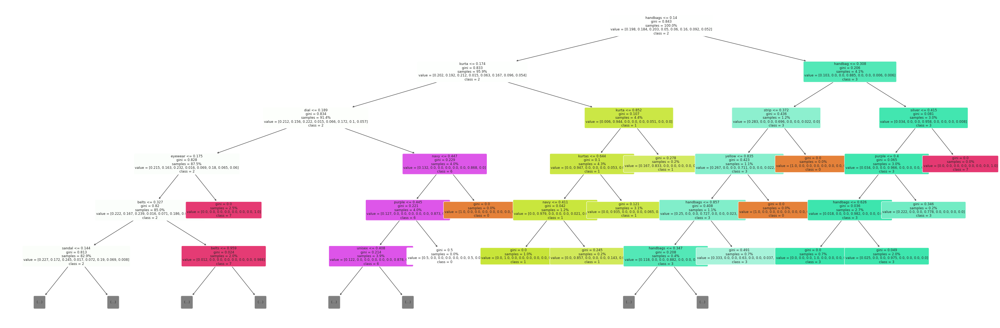

In [155]:
_pipeline.explain('explainColumn', 120, user_defined_stopwords, words_to_include_starting_list)  # set to get good enough accuracy

# 4f. Use Lime to get example explanation from classifier

In [156]:
_pipeline.lime_example("0")  # for class "0"

Cluster= 0, text= Women Accessories Bags Clutches Green Summer Year2012 Casual mod acc woman green clutch


In [158]:
_pipeline.lime_example(None)  # for random class

Cluster= 2, text= Men Footwear Shoes Casual Shoes Black Fall Year2011 Casual enroute men leather black casual shoe


# 4g. Plot word clouds

cluster= 0


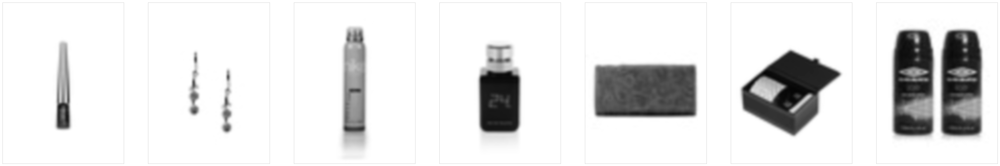

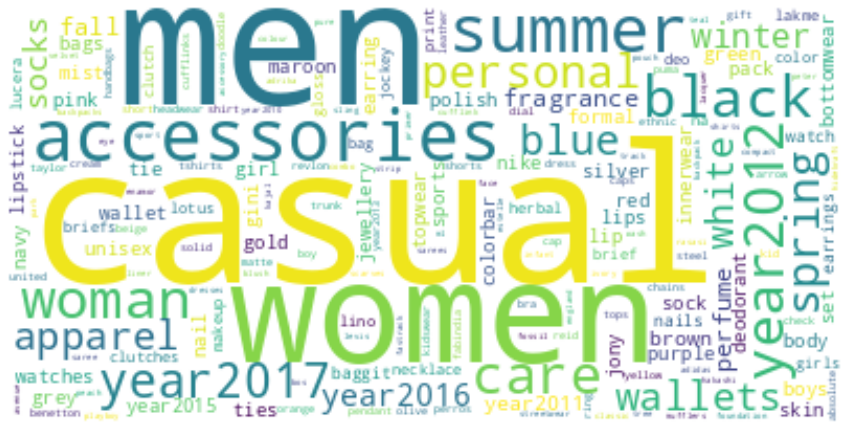

cluster= 1


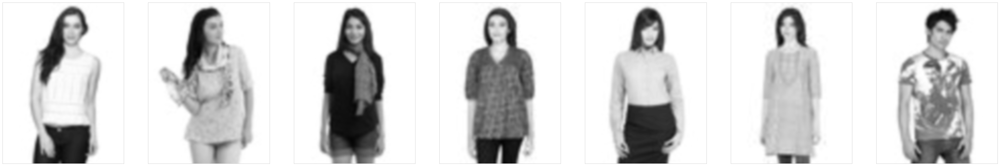

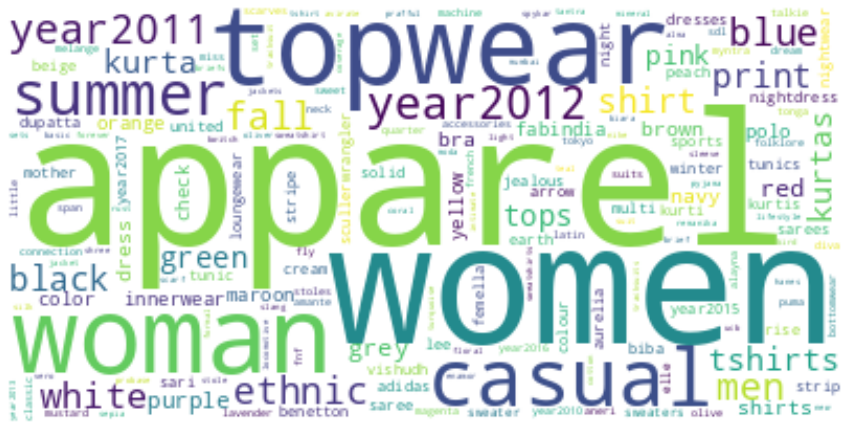

cluster= 2


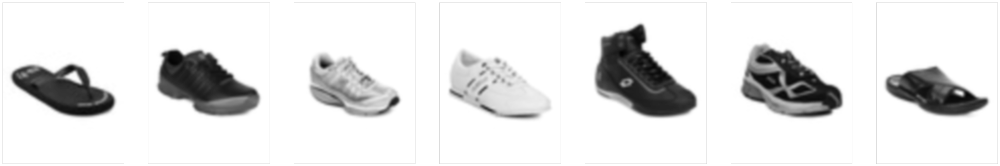

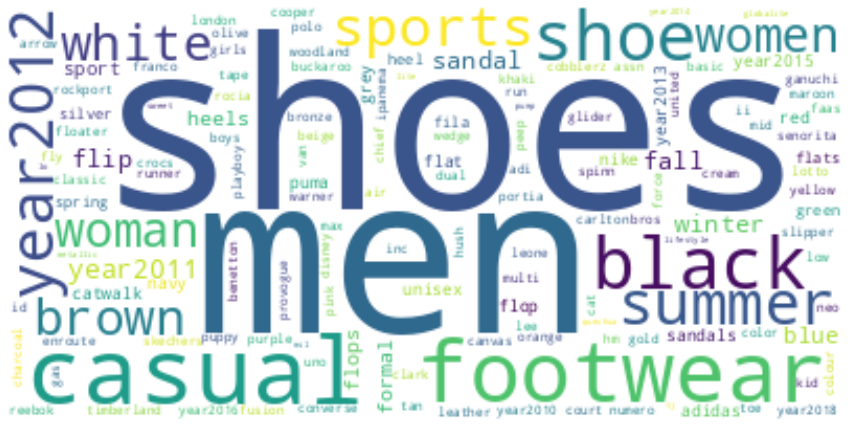

cluster= 3


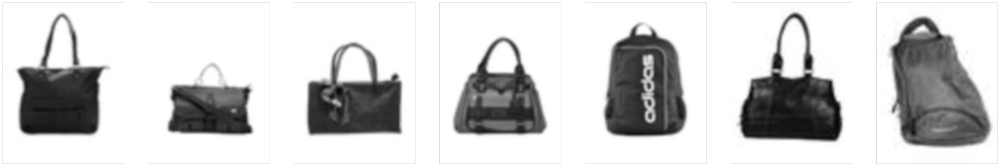

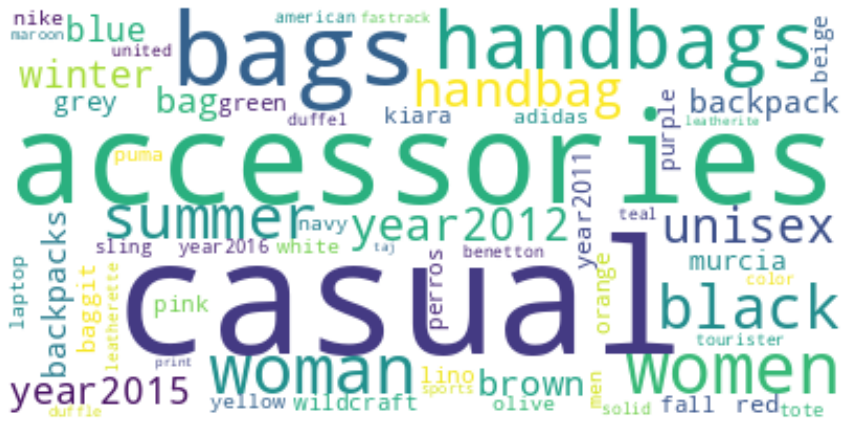

cluster= 4


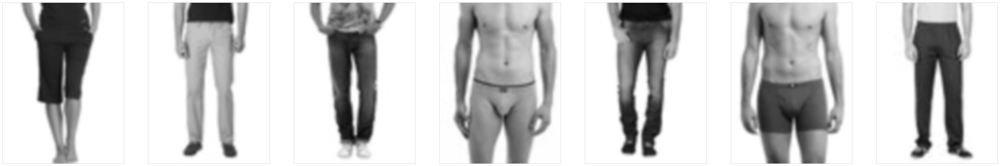

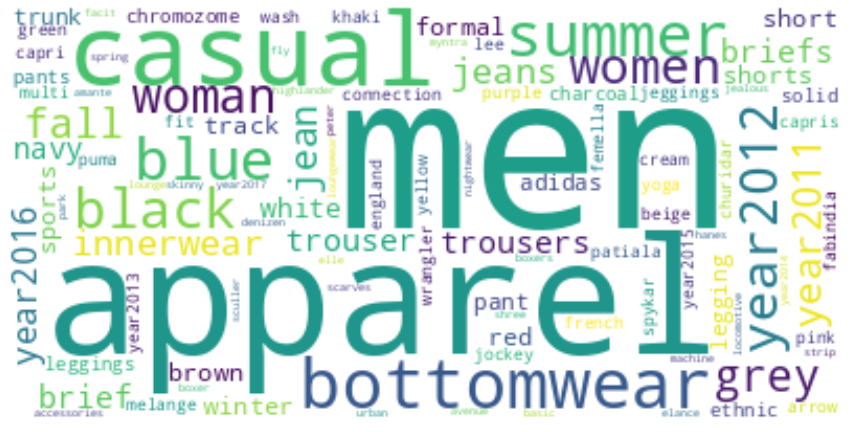

cluster= 5


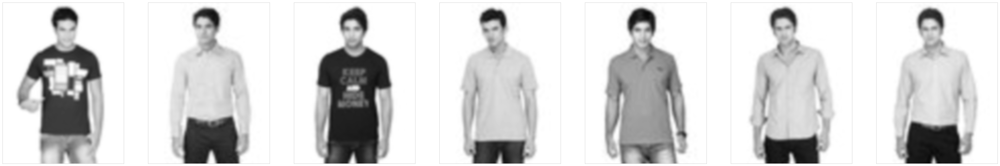

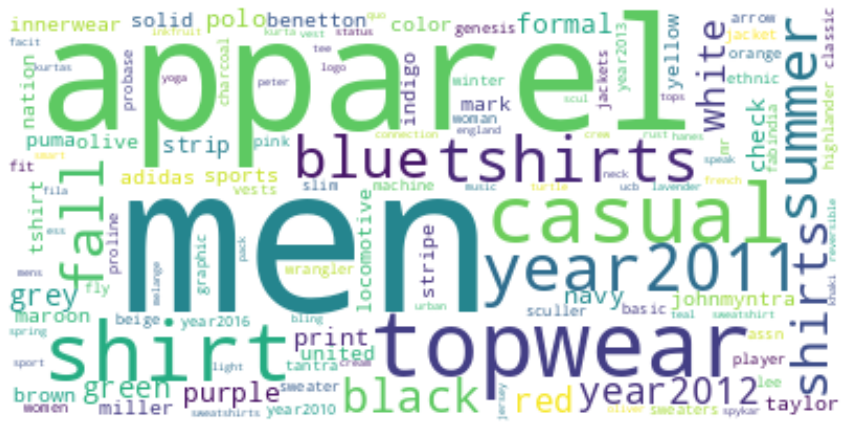

cluster= 6


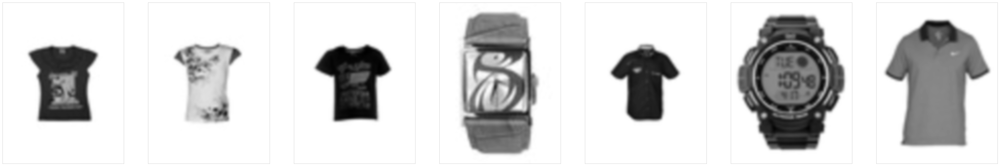

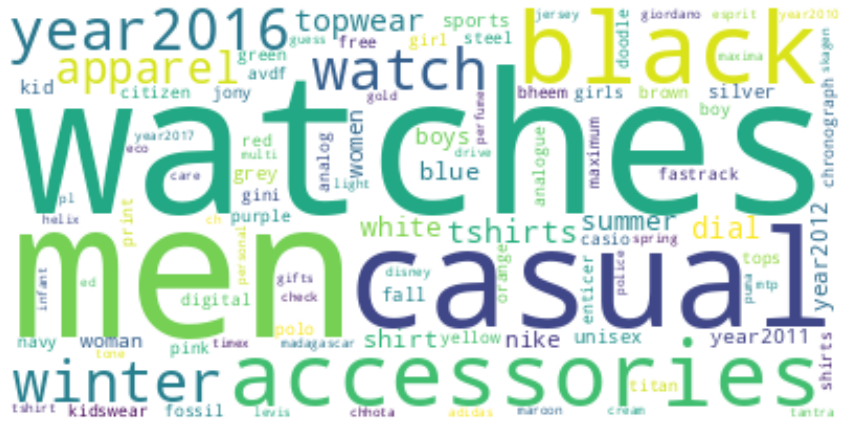

cluster= 7


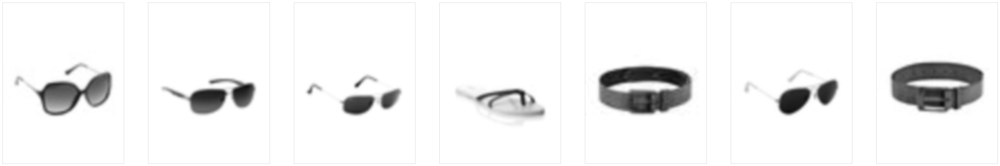

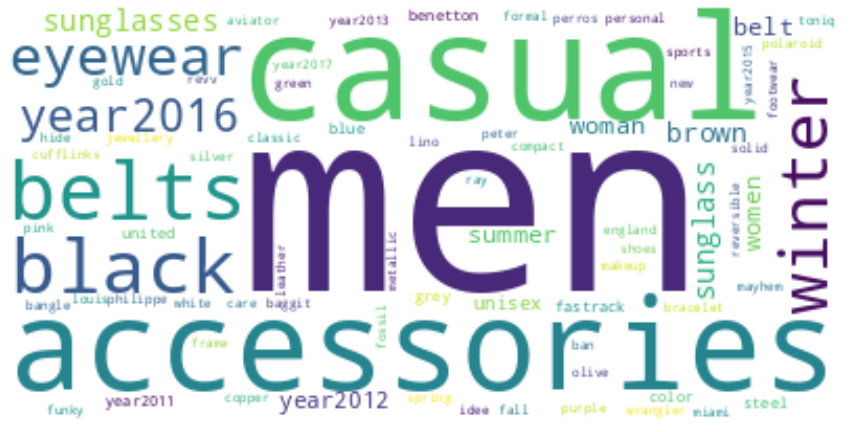

In [159]:
_pipeline.word_cloud(plot_example)  # pass function which presents examples of observations

# Full scale example